# Imports

In [1]:
import glob

import numpy as np
import matplotlib.pyplot as plt

from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

from pynistview_utils import *
from selelems import *

import cv2

plt.style.use('dark_background')

# Set up directories and files

In [2]:
# Configure input files

indir = "/Users/rmoraski/Documents/iCloud/School/Electrons/NISTView-ish/"
sempa_file_suffix = 'sempa'

name = "191001_Fe_whisker/Fe_whisker"
#name = "FeGd_Nov_Dec/171117_FeGd"
#name = "FeGd_Nov_Dec/FeGd100"
#name = "FeGd_Nov_Dec/FeGd200"
#name = 'alice/171117_FeGd'

run = 2

# Specify the number of features - 1 in the image. This is used to segment and create masks.
segments = 2

# Specify gaussian denoising sigma
sigma = 2

# Specify non-local denoising strength h. Larger h -> more denoising.
h = 20

# Specify a scale for drawing the vector arrows. Smaller number -> longer arrow.
arrow_scale = 0.2

# Specify a color for the vector arrows.
# arrow_color = 'black'
arrow_color = 'white'

# Import files

In [3]:
# Read in image data.


full_name = name + f'{run:0>3}'

file = indir + full_name

files = np.asarray(glob.glob('{}*x*{}'.format(file, sempa_file_suffix)))
files = np.append(files, glob.glob('{}*y*{}'.format(file, sempa_file_suffix)))
files = sorted(np.append(files, glob.glob('{}*z*{}'.format(file, sempa_file_suffix))))

# intensity, _ = image_data(file + im_suffix)
# m_1, axis_1 = image_data(file + m1_suffix)
# m_2, axis_2 = image_data(file + m2_suffix)
intensity, _ = image_data(files[0])
m_1, axis_1 = image_data(files[2])
m_2, axis_2 = image_data(files[3])

# Get file dimensions

m_1_ydim, m_1_xdim = m_1.shape
m_2_ydim, m_2_xdim = m_2.shape

# Extract extrema for later processing

m_1_min, m_1_max = m_1.min(), m_1.max()
m_2_min, m_2_max = m_2.min(), m_2.max()

# Flatten the intensity image

intensity_blurred = median_filter(intensity, 3);
intensity_flat = intensity - intensity_blurred;

scale = get_scale(files[0])

In [4]:
m_1_min, m_1_max, m_2_min, m_2_max

(0.64225286, 1.6741459, -0.72806233, 0.62693167)

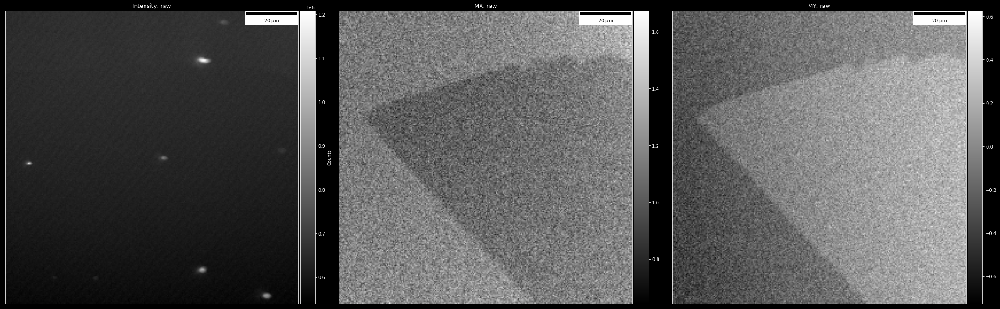

In [5]:
# Have a look at the input files

fig = plt.figure(figsize=(30, 15));

ax1 = show_subplot_raw(intensity, 1, 3, 1, 'Intensity, raw');
ax1.add_artist(ScaleBar(scale));

# Add a colorbar for counts
sm1 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(intensity.min(), intensity.max()))
divider1 = make_axes_locatable(ax1);
cax1 = divider1.append_axes('right', size='5%', pad=0.05);
sm1.set_array([]);
cbar1 = plt.colorbar(sm1, cax=cax1, orientation='vertical');
cbar1.set_label('Counts')

ax2 = show_subplot_raw(m_1, 1, 3, 2, 'M{}, raw'.format(axis_1));
ax2.add_artist(ScaleBar(scale));

sm2 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_1.min(), m_1.max()))
divider2 = make_axes_locatable(ax2);
cax2 = divider2.append_axes('right', size='5%', pad=0.05);
sm2.set_array([]);
cbar2 = plt.colorbar(sm2, cax=cax2, orientation='vertical');
#cbar2.set_label('Counts')

ax3 = show_subplot_raw(m_2, 1, 3, 3, 'M{}, raw'.format(axis_2));
ax3.add_artist(ScaleBar(scale));

sm3 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_2.min(), m_2.max()))
divider3 = make_axes_locatable(ax3);
cax3 = divider3.append_axes('right', size='5%', pad=0.05);
sm3.set_array([]);
cbar3 = plt.colorbar(sm3, cax=cax3, orientation='vertical');
#cbar3.set_label('Counts')

plt.tight_layout();

# Remove gradients

Imperfections in the imaging components might leave undesirable gradient artifacts in the image.

## Remove line errors

In [6]:
m_1_delined, m_2_delined = remove_line_errors(m_1, 20), remove_line_errors(m_2, 20)
m_1_delined, m_2_delined = rescale_to(m_1_delined, m_1), rescale_to(m_2_delined, m_2)

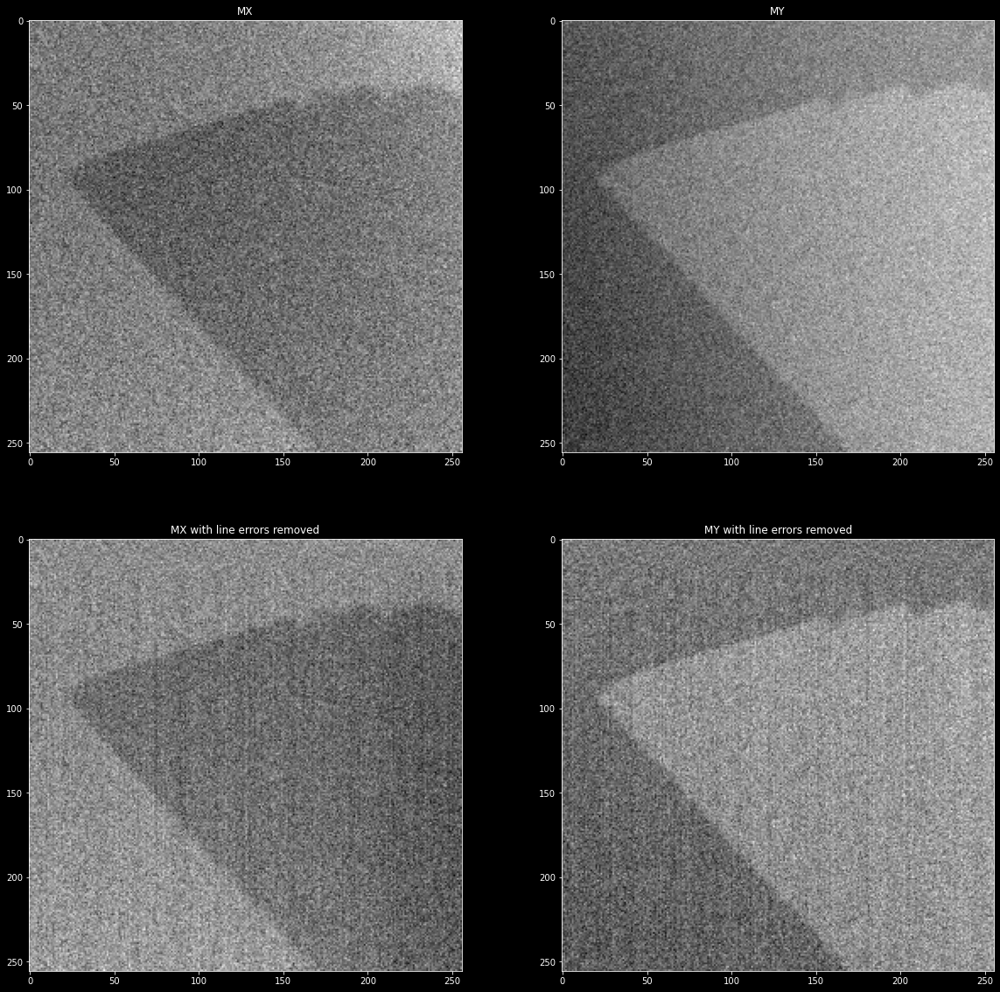

In [7]:
plt.figure(figsize=(20, 20));
plt.subplot(2, 2, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{}'.format(axis_1));
plt.subplot(2, 2, 2);
plt.imshow(m_2, cmap='gray');
plt.title('M{}'.format(axis_2));
plt.subplot(2, 2, 3);
plt.imshow(m_1_delined, cmap='gray');
plt.title('M{} with line errors removed'.format(axis_1));
plt.subplot(2, 2, 4);
plt.imshow(m_2_delined, cmap='gray');
plt.title('M{} with line errors removed'.format(axis_2));

## Mean shift

This is used to improve image segmentation

In [8]:
# m_1_shift, m_2_shift = mean_shift_filter(m_1_delined), mean_shift_filter(m_2_delined)
m_1_shift, m_2_shift = mean_shift_filter(m_1), mean_shift_filter(m_2)

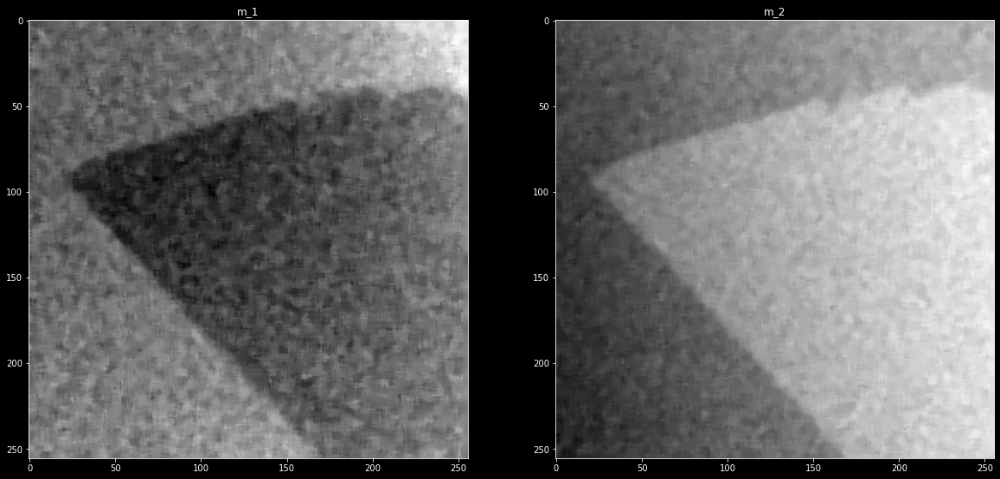

In [9]:
plt.figure(figsize=(20, 10));
plt.subplot(1, 2, 1);
plt.imshow(m_1_shift, cmap='gray');
plt.title('m_1');

plt.subplot(1, 2, 2);
plt.imshow(m_2_shift, cmap='gray');
plt.title('m_2');

## Segment

Find the features in the images

In [10]:
m_1_thresh, m_1_seg, m_1_masks = segment_image(m_1_shift, segments=segments)
m_2_thresh, m_2_seg, m_2_masks = segment_image(m_2_shift, segments=segments)

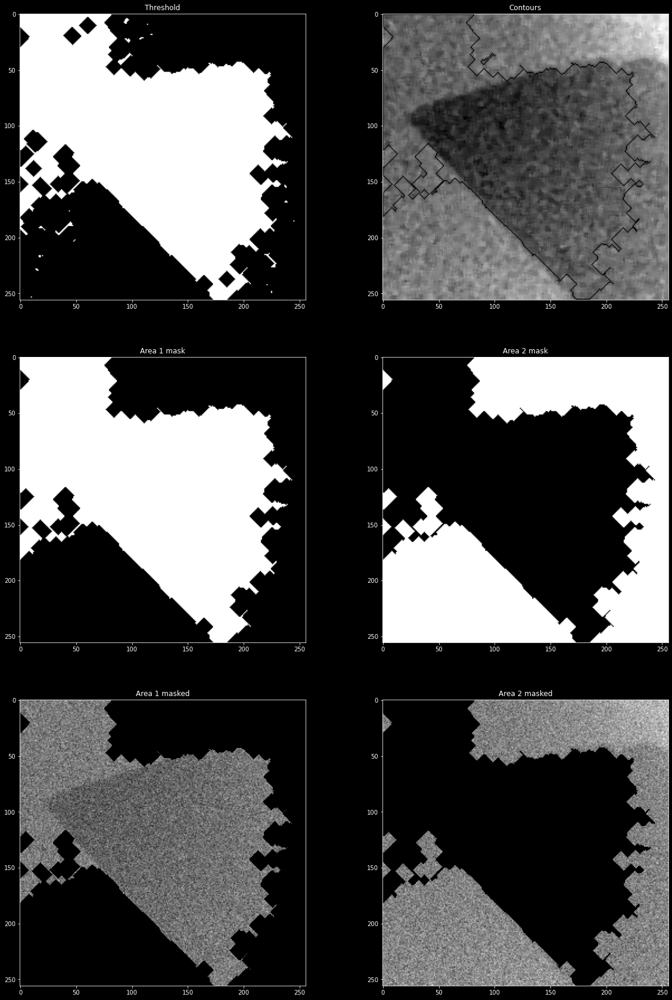

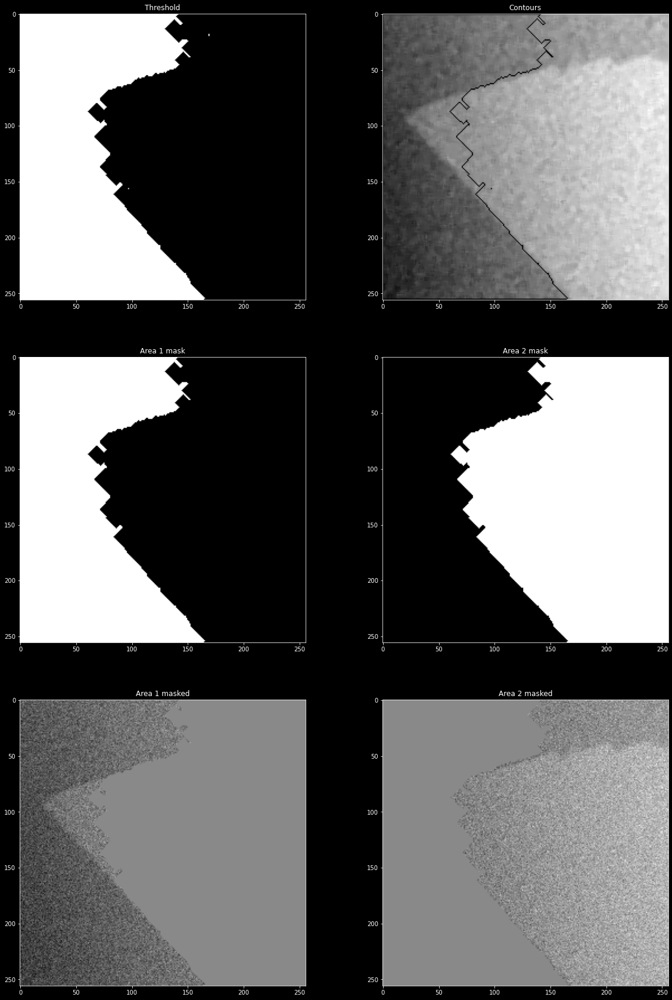

In [11]:
plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_1_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_1_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_1_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_1_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_1 * m_1_masks[0, 0], vmin=m_1_min, vmax=m_1_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_1 * m_1_masks[0, 1], vmin=m_1_min, vmax=m_1_max, cmap='gray');
plt.title('Area 2 masked');

plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_2_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_2_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_2_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_2_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_2 * m_2_masks[0, 0], vmin=m_2_min, vmax=m_2_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_2 * m_2_masks[0, 1], vmin=m_2_min, vmax=m_2_max, cmap='gray');
plt.title('Area 2 masked');

## Fit images

Find a polynomial fit for the images and remove the background gradient

In [28]:
# m_1 first
m_1_light_mask, m_1_dark_mask = m_1_masks[0, 0], m_1_masks[0, 1]

m_1_light_fit_all, m_1_light_fit = fit_image(m_1, m_1_light_mask)
m_1_dark_fit_all, m_1_dark_fit = fit_image(m_1, m_1_dark_mask)

m_1_light_fitted, m_1_dark_fitted = m_1 - m_1_light_fit_all, m_1 - m_1_dark_fit_all
m_1_both_fitted = m_1 - m_1_light_fit - m_1_dark_fit

# and m_2
m_2_light_mask, m_2_dark_mask = m_2_masks[0, 0], m_2_masks[0, 1]

m_2_light_fit_all, m_2_light_fit = fit_image(m_2, m_2_light_mask)
m_2_dark_fit_all, m_2_dark_fit = fit_image(m_2, m_2_dark_mask)

m_2_light_fitted, m_2_dark_fitted = m_2 - m_2_light_fit_all, m_2 - m_2_dark_fit_all
m_2_both_fitted = m_2 - m_2_light_fit - m_2_dark_fit

# Rescale both
m_1_light_fitted, m_2_light_fitted = rescale_to(m_1_light_fitted, m_1), rescale_to(m_2_light_fitted, m_2)

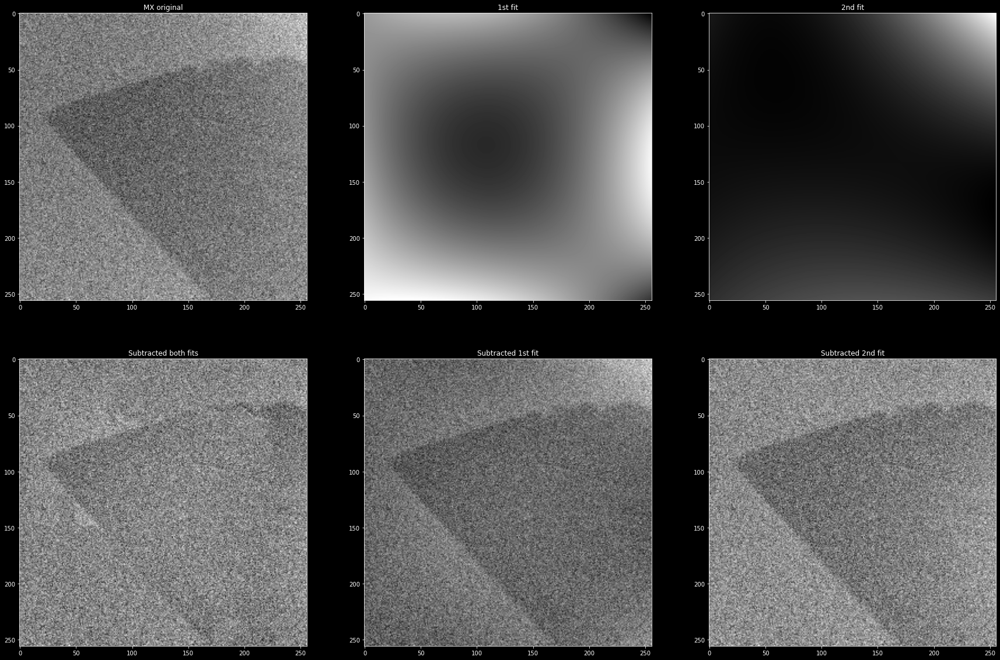

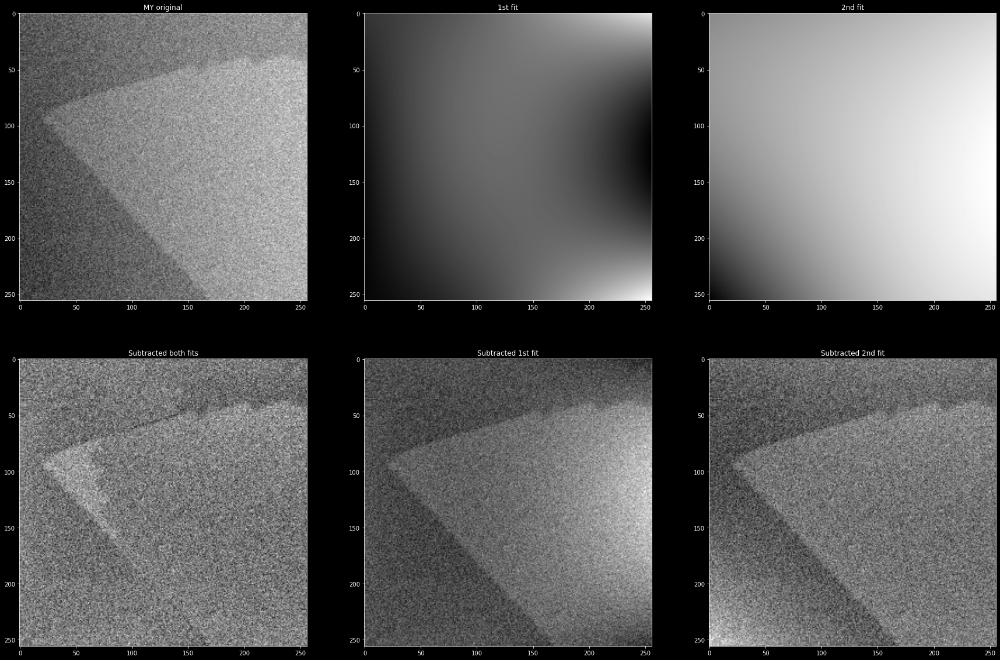

In [29]:
plt.figure(figsize=(30, 20));

plt.subplot(2, 3, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{} original'.format(axis_1));
plt.subplot(2, 3, 2);
plt.imshow(m_1_light_fit_all, cmap='gray');
plt.title('1st fit');
plt.subplot(2, 3, 3);
plt.imshow(m_1_dark_fit_all, cmap='gray');
plt.title('2nd fit');
plt.subplot(2, 3, 4);
plt.imshow(m_1_both_fitted, cmap='gray');
plt.title('Subtracted both fits');
plt.subplot(2, 3, 5);
plt.imshow(m_1_light_fitted, cmap='gray');
plt.title('Subtracted 1st fit');
plt.subplot(2, 3, 6);
plt.imshow(m_1 - m_1_dark_fit_all, cmap='gray');
plt.title('Subtracted 2nd fit');

plt.figure(figsize=(30, 20));
plt.subplot(2, 3, 1);
plt.imshow(m_2, cmap='gray');
plt.title('M{} original'.format(axis_2));
plt.subplot(2, 3, 2);
plt.imshow(m_2_light_fit_all, cmap='gray');
plt.title('1st fit');
plt.subplot(2, 3, 3);
plt.imshow(m_2_dark_fit_all, cmap='gray');
plt.title('2nd fit');
plt.subplot(2, 3, 4);
plt.imshow(m_2_both_fitted, cmap='gray');
plt.title('Subtracted both fits');
plt.subplot(2, 3, 5);
plt.imshow(m_2_light_fitted, cmap='gray');
plt.title('Subtracted 1st fit');
plt.subplot(2, 3, 6);
plt.imshow(m_2 - m_2_dark_fit_all, cmap='gray');
plt.title('Subtracted 2nd fit');

# Remove noise

In [14]:
m_1_fitted_denoised, m_1_fitted_denoised_blurred = clean_image(m_1_light_fitted, sigma=sigma, h=h)
m_2_fitted_denoised, m_2_fitted_denoised_blurred = clean_image(m_2_light_fitted, sigma=sigma, h=h)

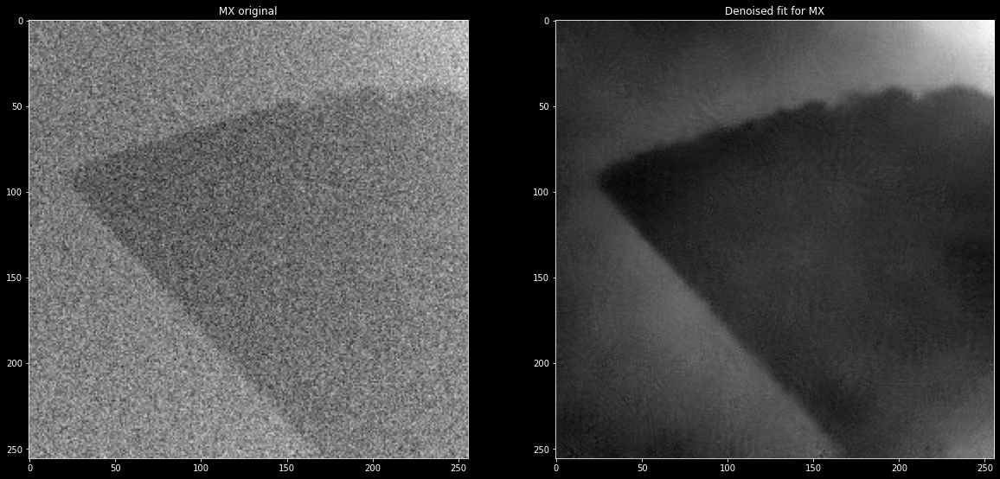

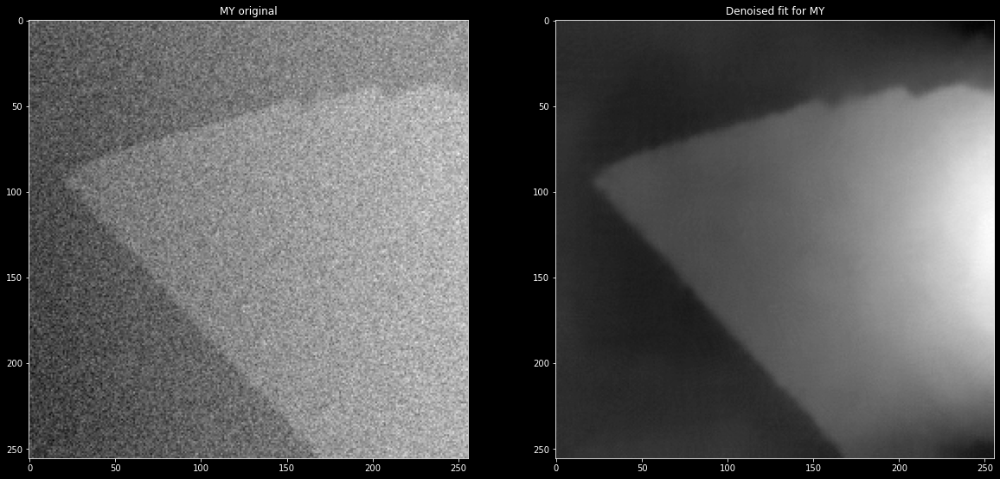

In [15]:
plt.figure(figsize=(20, 10));

plt.subplot(1, 2, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{} original'.format(axis_1));
plt.subplot(1, 2, 2);
plt.imshow(m_1_fitted_denoised, cmap='gray');
plt.title('Denoised fit for M{}'.format(axis_1));

plt.figure(figsize=(20, 10));

plt.subplot(1, 2, 1);
plt.imshow(m_2, cmap='gray');
plt.title('M{} original'.format(axis_2));
plt.subplot(1, 2, 2);
plt.imshow(m_2_fitted_denoised, cmap='gray');
plt.title('Denoised fit for M{}'.format(axis_2));

# Find offsets

The imaging components do not use the same zero point. Since the magnetization vector should have the same magnitude over the entire sample, minimize the min to max spread across the combined images.

In [25]:
# Minimize the min to max spread on the magnitudes of the combines images. Use CoM for a starting point.

offsets, status, message = find_offsets(m_1_fitted_denoised, m_2_fitted_denoised)
m_1_offset, m_2_offset = offsets

print('Found offsets: {}'.format(offsets))
print('Status code {}: {}'.format(status, message))
print("Raw files' ptp: {:.5f}".format(np.ptp(get_magnitudes(m_1, m_2))))
print("Offset files' ptp: {:.5f}".format(np.ptp(get_magnitudes(m_1_fitted_denoised - m_1_offset, m_2_fitted_denoised - m_2_offset))))

Found offsets: [1.46029365 0.55297331]
Status code 4: Both `ftol` and `xtol` termination conditions are satisfied.
Raw files' ptp: 1.00846
Offset files' ptp: 0.78043


In [26]:
find_com(m_1_fitted_denoised, m_2_fitted_denoised)

(0.988081476998957, -0.4014292963579891)

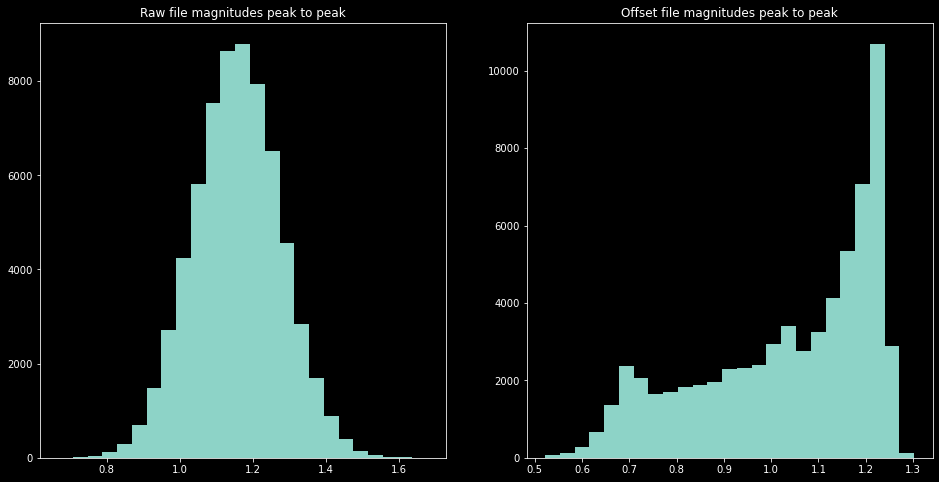

In [17]:
plt.figure(figsize=(16, 8));
plt.subplot(1, 2, 1);
plt.hist(get_magnitudes(m_1, m_2).ravel(), bins=25);
plt.title('Raw file magnitudes peak to peak');
plt.subplot(1, 2, 2);
plt.hist(get_magnitudes(m_1_fitted_denoised - m_1_offset, m_2_fitted_denoised - m_2_offset).ravel(), bins=25);
plt.title('Offset file magnitudes peak to peak');

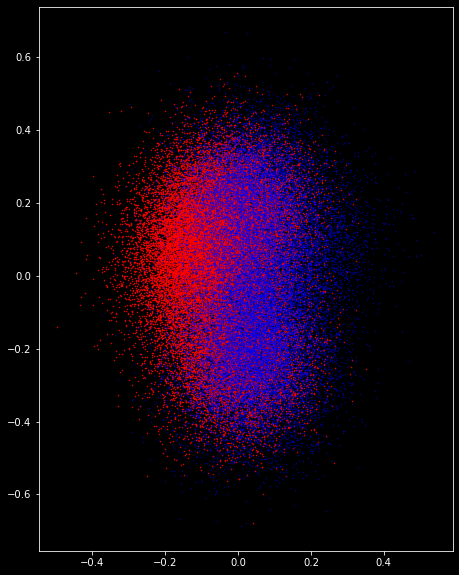

In [56]:
m_1_average, m_2_average = np.average(m_1), np.average(m_2)
m_1_shifted, m_2_shifted = m_1 - m_1_average, m_2 - m_2_average

plt.figure(figsize=(10, 10))
plt.plot(m_1_shifted * m_1_light_mask, m_2_shifted * m_1_light_mask, 'r.', ms=1);
plt.plot(m_1_shifted * m_1_dark_mask, m_2_shifted * m_1_dark_mask, 'b.', ms=1, alpha=0.5);
plt.gca().set_aspect(1)

In [55]:
np.average(m_1), np.average(m_2)

(1.1373085, -0.041345254)

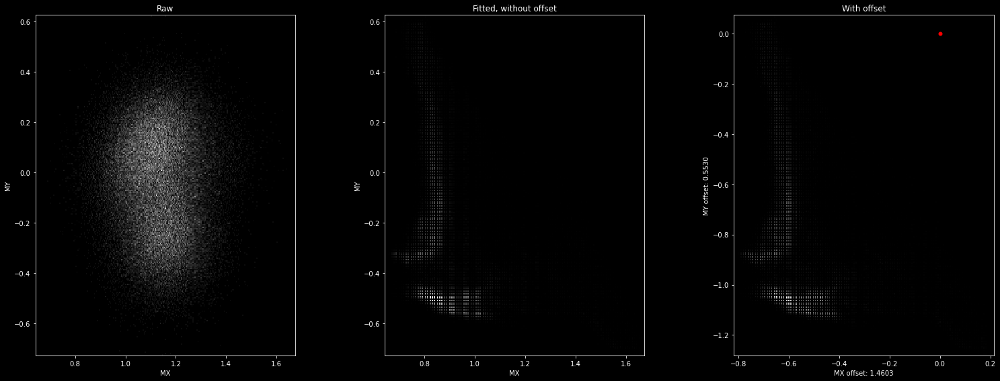

In [18]:
fig = plt.figure(figsize=(22, 8));
ax1 = fig.add_subplot(1, 3, 1);
ax2 = fig.add_subplot(1, 3, 2);
ax3 = fig.add_subplot(1, 3, 3);

ax1.hist2d(m_1.ravel(), m_2.ravel(), bins=256, cmap='gray');
ax1.set_xlabel('M{}'.format(axis_1));
ax1.set_ylabel('M{}'.format(axis_2));
ax1.set_title('Raw');
ax1.set_aspect('equal');

ax2.hist2d(m_1_fitted_denoised.ravel(), m_2_fitted_denoised.ravel(), bins=256, cmap='gray');
ax2.set_xlabel('M{}'.format(axis_1));
ax2.set_ylabel('M{}'.format(axis_2));
ax2.set_title('Fitted, without offset');
ax2.set_aspect('equal');

ax3.hist2d(m_1_fitted_denoised.ravel() - m_1_offset, m_2_fitted_denoised.ravel() - m_2_offset, bins=256, cmap='gray');
ax3.plot(0, 0, 'r.', ms=10);
ax3.set_xlabel('M{} offset: {:.4f}'.format(axis_1, m_1_offset));
ax3.set_ylabel('M{} offset: {:.4f}'.format(axis_2, m_2_offset));
ax3.set_title('With offset');
ax3.set_aspect('equal');

plt.tight_layout();

# Apply offsets

In [19]:
# Apply offsets

m_1_denoised, m_2_denoised = m_1_fitted_denoised - m_1_offset, m_2_fitted_denoised - m_2_offset

print('M{} denoised - min: {:.2f}, max: {:.2f}, average: {:.2f}, PtP: {:.2f}'.format(
    axis_1, m_1_denoised.min(), m_1_denoised.max(), np.average(m_1_denoised), np.ptp(m_1_denoised)))
print('M{} denoised - min: {:.2f}, max: {:.2f}, average: {:.2f}, PtP: {:.2f}'.format(
    axis_2, m_2_denoised.min(), m_2_denoised.max(), np.average(m_2_denoised), np.ptp(m_2_denoised)))

MX denoised - min: -0.82, max: 0.21, average: -0.57, PtP: 1.03
MY denoised - min: -1.28, max: 0.07, average: -0.83, PtP: 1.35


In [20]:
# Extract phase and magnitude information

phases = get_phases(m_1_denoised, m_2_denoised)
magnitudes = get_magnitudes(m_1_denoised, m_2_denoised)
magnitudes /= magnitudes.max()
print('Phase spectrum for run {}: {:.6f} - {:.6f} ({:.3f}º - {:.3f}º)'.format(
    run, phases.min(), phases.max(), phases.min() * 180 / np.pi, phases.max() * 180 / np.pi))

Phase spectrum for run 2: 2.826288 - 4.774486 (161.934º - 273.558º)


# Display results

In [21]:
# Show a colorized version of the domains

img = render_phases_and_magnitudes(magnitudes, phases)

In [22]:
np.min(img), np.max(img), np.min(phases), np.max(phases), np.min(magnitudes), np.max(magnitudes)

(0.10777285788311847,
 0.9381494724993175,
 2.826287909296269,
 4.774486037187369,
 0.4007290972716586,
 1.0)

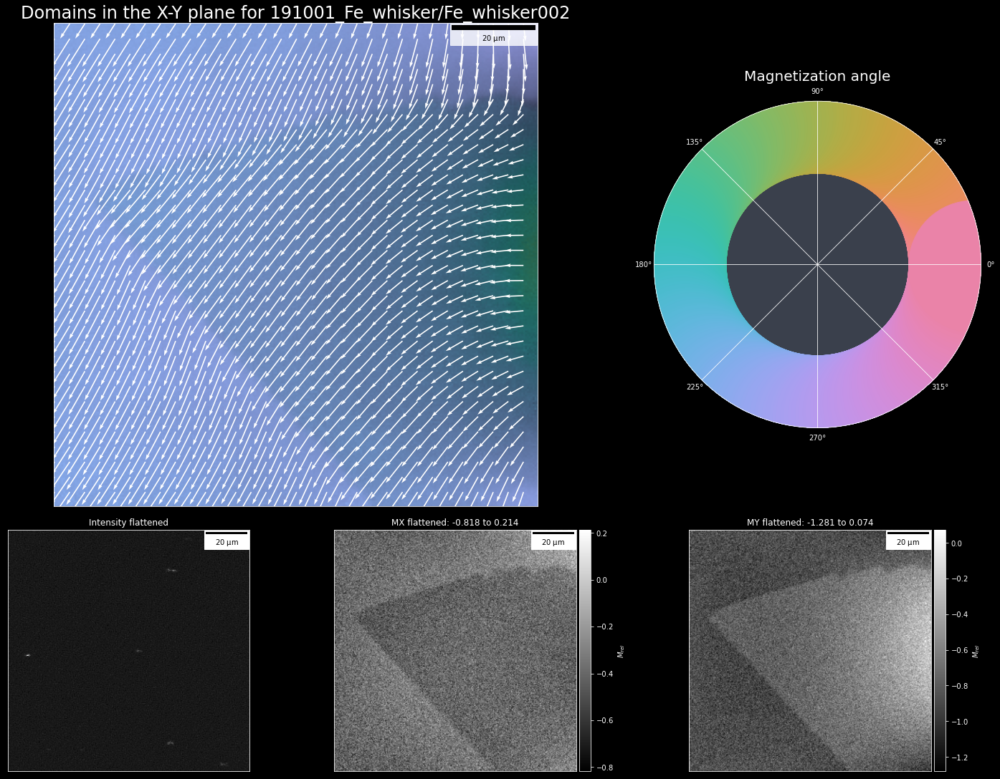

In [23]:
display_results(img, m_1_denoised, m_1_light_fitted - m_1_offset, m_2_denoised, m_2_light_fitted - m_2_offset, intensity_flat, scale, full_name, arrow_scale=arrow_scale * 30, arrow_color=arrow_color, axis_1=axis_1, axis_2=axis_2)

In [24]:
save_file(file, intensity_flat, img, axis_1, axis_2, scale, img_denoised_1=m_1_denoised,
          img_denoised_2=m_2_denoised, arrow_color=arrow_color, arrow_scale=arrow_scale)